# Исследование объявлений о продаже квартир

В проекте представлены данные сервиса Яндекс Недвижимость — архив объявлений за несколько лет о продаже квартир в Санкт-Петербурге и соседних населённых пунктах. Исходные данные представлены в файде real_estate_data.csv.

**Цель исследования** — выполнить предобработку данных и изучить их, чтобы найти интересные особенности и зависимости, которые существуют на рынке недвижимости. В дальнейшем это поможет установить приоритетные параметры для автоматизации систем сервиса, которые помогут определеть рыночную стоимость объекта, тостлеживать аномалии и мошенническую деятельность.

О каждой квартире в базе содержится два типа данных: добавленные пользователем и картографические. Например, к первому типу относятся площадь квартиры, её этаж и количество балконов, ко второму — расстояния до центра города, аэропорта и ближайшего парка.

**Ход исследования:** 

    1. Загрузка данных    
    2. Предобработка данных
    3. Добавление необходимых вспомогательных слолбцов
    4. Проведение исследовательского анализа данных
    5. Общий вывод

### Загрузка данных, общая информация 

In [1]:
# ипортируем нужные библиотеки
import pandas as pd
from matplotlib import pyplot as plt
import matplotlib

In [2]:
import plotly.express as px

In [3]:
#настройка, чтобы можно было просматривать все столбцы датафрейма
matplotlib.rcParams.update({'font.size': 14})
pd.options.display.max_columns = 100

In [4]:
base_dataset = pd.read_csv('/datasets/real_estate_data.csv', sep='\t')

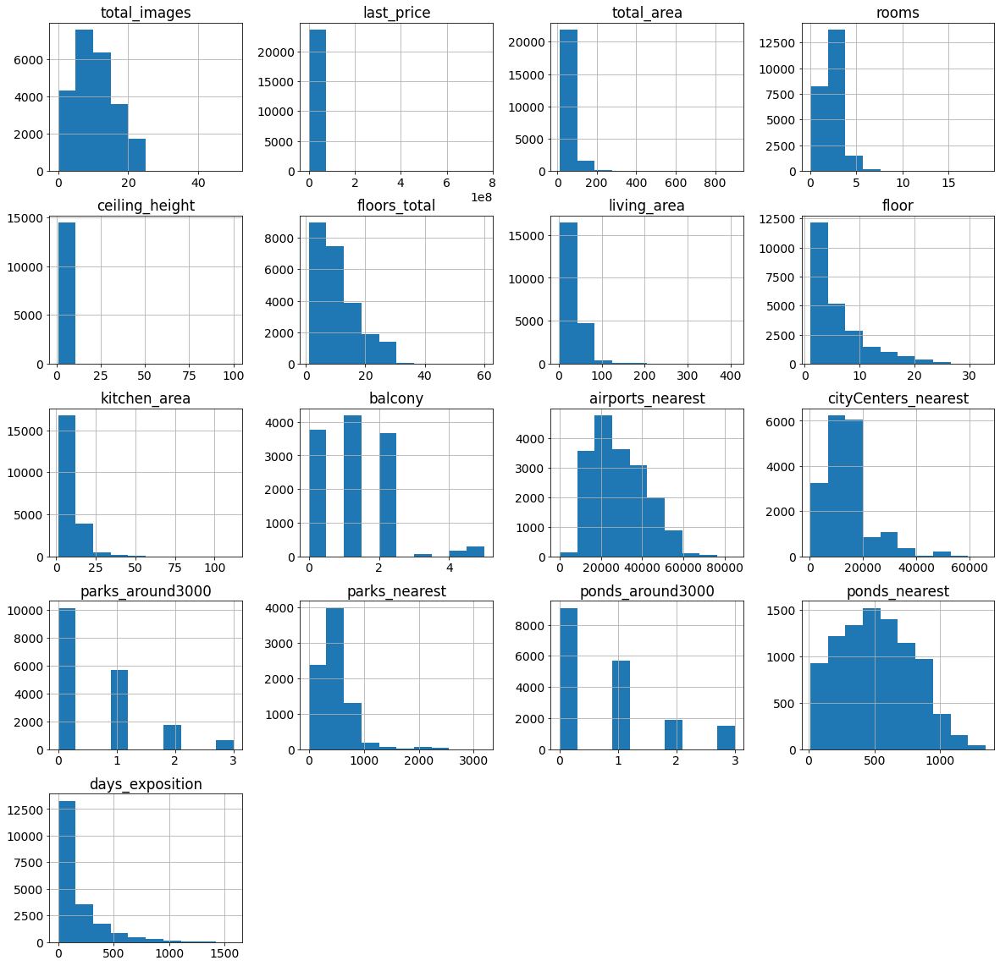

In [5]:
# Построим общую гистограмму для всех столбцов таблицы
base_dataset.hist(figsize=(20,20))
plt.show()

### Предобработка данных

In [6]:
base_dataset.shape 

(23699, 22)

In [7]:
base_dataset.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
0,20,13000000.0,108.0,2019-03-07T00:00:00,3,2.70,16.0,51.0,8,NaN,False,False,25.0,NaN,Санкт-Петербург,18863.0,16028.0,1.0,482.0,2.0,755.0,NaN
1,7,3350000.0,40.4,2018-12-04T00:00:00,1,NaN,11.0,18.6,1,NaN,False,False,11.0,2.0,посёлок Шушары,12817.0,18603.0,0.0,NaN,0.0,NaN,81.0
2,10,5196000.0,56.0,2015-08-20T00:00:00,2,NaN,5.0,34.3,4,NaN,False,False,8.3,0.0,Санкт-Петербург,21741.0,13933.0,1.0,90.0,2.0,574.0,558.0
3,0,64900000.0,159.0,2015-07-24T00:00:00,3,NaN,14.0,NaN,9,NaN,False,False,NaN,0.0,Санкт-Петербург,28098.0,6800.0,2.0,84.0,3.0,234.0,424.0
4,2,10000000.0,100.0,2018-06-19T00:00:00,2,3.03,14.0,32.0,13,NaN,False,False,41.0,NaN,Санкт-Петербург,31856.0,8098.0,2.0,112.0,1.0,48.0,121.0


In [8]:
base_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23699 entries, 0 to 23698
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   total_images          23699 non-null  int64  
 1   last_price            23699 non-null  float64
 2   total_area            23699 non-null  float64
 3   first_day_exposition  23699 non-null  object 
 4   rooms                 23699 non-null  int64  
 5   ceiling_height        14504 non-null  float64
 6   floors_total          23613 non-null  float64
 7   living_area           21796 non-null  float64
 8   floor                 23699 non-null  int64  
 9   is_apartment          2775 non-null   object 
 10  studio                23699 non-null  bool   
 11  open_plan             23699 non-null  bool   
 12  kitchen_area          21421 non-null  float64
 13  balcony               12180 non-null  float64
 14  locality_name         23650 non-null  object 
 15  airports_nearest   

#### Изучим пропущенные значения в столбцах

In [9]:
# Посмотрим в каких стобцах есть пропуски
base_dataset.isna().sum()

total_images                0
last_price                  0
total_area                  0
first_day_exposition        0
rooms                       0
ceiling_height           9195
floors_total               86
living_area              1903
floor                       0
is_apartment            20924
studio                      0
open_plan                   0
kitchen_area             2278
balcony                 11519
locality_name              49
airports_nearest         5542
cityCenters_nearest      5519
parks_around3000         5518
parks_nearest           15620
ponds_around3000         5518
ponds_nearest           14589
days_exposition          3181
dtype: int64

In [10]:
# Посмотрим в каких стобцах есть пропуски
pd.DataFrame(round(base_dataset.isna().mean()*100,)).style.background_gradient('coolwarm')

,0
total_images,0.000000
last_price,0.000000
total_area,0.000000
first_day_exposition,0.000000
rooms,0.000000
ceiling_height,39.000000
floors_total,0.000000
living_area,8.000000
floor,0.000000
is_apartment,88.000000


#### Заполним пропуски там где это возможно

обрабатываем пропуски в ceiling_height. Вероятно пользователи сервиса при заполнении поленились заполнить информацию, которую не сочли важной.

In [11]:
locality_name = 'Санкт-Петербург'
median_ceiling_height = base_dataset.loc[base_dataset['locality_name']==locality_name, 'ceiling_height'].median()
median_ceiling_height

2.7

In [12]:
# Заменим пропуски высоты потолков на медианные значения по каждой локации
for locality_name in base_dataset['locality_name'].unique():
    median_ceiling_height = base_dataset.loc[base_dataset['locality_name']==locality_name, 'ceiling_height'].median()
    base_dataset.loc[(base_dataset['ceiling_height'].isna()) &
        (base_dataset['locality_name']==locality_name), 'ceiling_height'] = median_ceiling_height

In [13]:
# Оставшиеся пропуски по высоте потолков заполним медианным значением
base_dataset['ceiling_height'] = base_dataset['ceiling_height'].fillna(base_dataset['ceiling_height'].median())

обрабатываем пропуски в floors_total. Вероятно пользователи сервиса при заполнении поленились заполнить информацию, которую не сочли важной.

высоту здания возьмем среднюю для конкретного населенного пункта, при этом если она ниже конкретного этажа, то берем значение этажа

In [14]:
# создадим вспомогательный список уникальных locality_name
locality_name_list = list(base_dataset['locality_name'].dropna().unique())

In [15]:
# создадим вспомогательную таблицу со средней этажностью домомв в населенных пунктах
mean_floors_total_locality = base_dataset.pivot_table(index='locality_name', values='floors_total', aggfunc='mean')
mean_floors_total_locality['floors_total'] = mean_floors_total_locality['floors_total'].astype(int)
mean_floors_total_locality.head()

,floors_total
locality_name,
Бокситогорск,4
Волосово,4
Волхов,4
Всеволожск,8
Выборг,5


In [16]:
# с помощью цикла присваиваем Nan среднюю для конкретного населенного пункта
for i in locality_name_list:
    base_dataset.loc[(base_dataset['floors_total'].isna()) \
                         & (base_dataset['locality_name'] == i), 'floors_total'] = \
    int(mean_floors_total_locality['floors_total'][mean_floors_total_locality.index == i])

In [17]:
# вспомогательный метод для замены некорректные значения floors_total
def func_floors_comparison(row):
    if row['floor'] > row['floors_total']:
        return row['floor']
    else:
        return row['floors_total']

In [18]:
# сравниваем этаж кв и количество этажей в здании, заменяем некорректные значения floors_total 
base_dataset['floors_total'] = base_dataset[['floors_total', 'floor']].apply(func_floors_comparison, axis=1)

In [19]:
# отработаем пропуск 'floors_total' и 'locality_name' == Nan, присвоим среднюю этажность по всем locality_name
base_dataset.loc[base_dataset['floors_total'].isna() & (base_dataset['locality_name'].isna()), 'floors_total'] = int(mean_floors_total_locality['floors_total'].mean())

отработаем пропуски в living_area. Вероятно пользователи сервиса при заполнении поленились заполнить информацию, которую не сочли важной. Т.к. есть информация об общей площади и кухне

можем посчитать общий % жилой площади от общей площади, и использовать его при заполнении пустых значений 

In [20]:
mean_proportion_living_area = (base_dataset['living_area'] / base_dataset['total_area']).mean()
mean_proportion_living_area

0.5647655216993234

In [21]:
# заполним пустые ячейки методом fillna 
base_dataset['living_area'] = base_dataset['living_area'].fillna(base_dataset['total_area']*mean_proportion_living_area)

отработаем пропуски в is_apartment

In [22]:
# для данного поля целесообразно принять пропуски как False
base_dataset['is_apartment'] = base_dataset['is_apartment'].fillna(False)

отработаем пропуски в kitchen_area. Это важный параметр, и ленью пользователей сервиса его сложно объяснить. Возможно всё-таки кто-то поторопился и заполнитл данные некачественно, но возможен и сбой на портале сервиса.

для данного поля целесообразно рассчитать среднюю пропорцию площади кухни по каждой локации. Далее для пустых значений рассчитать площадь кухни по общей площади умноженной на полученную пропорцию

In [23]:
# подготовим вспомогательный столбец 
base_dataset['proportion_kitchen_area'] = base_dataset['kitchen_area'] / base_dataset['total_area']

In [24]:
# найдём медиану пропорции площади кухни для каждой локации (взяли медиану, чтобы убрать влияние пропусков)
madian_proportion_kitchen_area = base_dataset.pivot_table(index='locality_name', values=('proportion_kitchen_area'), aggfunc='median')
madian_proportion_kitchen_area.columns = ['madian_proportion_kitchen_area']
madian_proportion_kitchen_area.head()

,madian_proportion_kitchen_area
locality_name,
Бокситогорск,0.139535
Волосово,0.153846
Волхов,0.145455
Всеволожск,0.183639
Выборг,0.150000


In [25]:
#  подготовим второй вспомогательный столбец
base_dataset = base_dataset.join(madian_proportion_kitchen_area, on='locality_name', how='left')

In [26]:
# осталось 28 значений Nan madian_proportion_kitchen_area т.к. не во всех локациях есть медиана kitchen_area
# заполним эти значения медианой по всем локациям
base_dataset['madian_proportion_kitchen_area'] = base_dataset['madian_proportion_kitchen_area'].fillna(madian_proportion_kitchen_area['madian_proportion_kitchen_area'].median())

In [27]:
# заполним Nan методом fillna
base_dataset['kitchen_area'] = base_dataset['kitchen_area'].fillna(base_dataset['total_area'] * base_dataset['madian_proportion_kitchen_area'])

отработаем пропуски в balcony. Этот показатель явно не критичный, и вероятно отсутвие данных действительно говорит об отсутствии балкона.

In [28]:
# заменим пропуски на 0
base_dataset['balcony'] = base_dataset['balcony'].fillna(0)

заменим пропуски locality_name на unknown. Один из важнейших показателей, может быть объясним как безответственным отношением пользователя при заполнении, так и техническим сбоем на портале сервиса.

In [29]:
base_dataset['locality_name'] = base_dataset['locality_name'].fillna('unknown')

отработаем пропуски в airports_nearest. На наш взгляд, данный показатель не является критичным, поэтому вероятно некоторые пользователи при заполнеии данных просто не обратили на него внимание.

для данного поля целесообразно присвоить пропускам медианные значения для каждого населенного пункта

In [30]:
median_airports_nearest_locality = base_dataset.pivot_table(index='locality_name', values='airports_nearest', aggfunc='median')
median_airports_nearest_locality.head()

,airports_nearest
locality_name,
unknown,22041.0
Зеленогорск,72282.0
Колпино,26232.0
Красное Село,25715.5
Кронштадт,67850.0


In [31]:
# заменим значения циклом 
# не берем Санкт-Петербург т.к. в нем брать медианные значения будет слишком грубо
# по остальным пропускам отработаем ниже
for i in list(median_airports_nearest_locality.index):
    if i not in ['Санкт-Петербург', 'unknown']:
        base_dataset.loc[(base_dataset['locality_name'] == i)\
                       & (base_dataset['airports_nearest'].isna()), 'airports_nearest'] =\
         float(median_airports_nearest_locality[median_airports_nearest_locality.index==i]['airports_nearest'])

In [32]:
# заменим значения циклом  на общую медиану (кроме Питера)
for i in list(median_airports_nearest_locality.index):
    if i not in ['Санкт-Петербург']:
        base_dataset.loc[(base_dataset['locality_name'] == i)\
               & (base_dataset['airports_nearest'].isna()), 'airports_nearest'] =\
        base_dataset['airports_nearest'].median()

Не заполняем пропуски airports_nearest в Санкт-Петербурге т.к. в нем брать медианные значения будет слишком грубо. Пока оставляем эти пропуски как есть.

отработаем пропуски в cityCenters_nearest, заменим их на медианное значение в каждой локации. На наш взгляд, данный показатель не является критичным, поэтому вероятно некоторые пользователи при заполнеии данных просто не обратили на него внимание.

In [33]:
# подготовим вспомогательную таблицу
median_cityCenters_nearest_locality = base_dataset.pivot_table(index='locality_name', values='cityCenters_nearest', aggfunc='median')
median_cityCenters_nearest_locality.head()

,cityCenters_nearest
locality_name,
unknown,8943.0
Зеленогорск,53381.0
Колпино,32018.0
Красное Село,29140.5
Кронштадт,49575.0


In [34]:
# заменим значения циклом 
for i in list(median_cityCenters_nearest_locality.index):
    if i != 'unknown':
        base_dataset.loc[base_dataset['cityCenters_nearest'].isna()\
                       &(base_dataset['locality_name']==i), 'cityCenters_nearest'] =\
        float(median_cityCenters_nearest_locality[median_cityCenters_nearest_locality.index==i]['cityCenters_nearest'])

После заполнения осталось 5394 пропуска, это много. Но пока оставим как есть, считаю, что заполнять их медианными значениями некорректно.

отработаем пропуски в parks_around3000. На наш взгляд, данный показатель не является критичным, поэтому вероятно некоторые пользователи при заполнеии данных просто не обратили на него внимание.

In [35]:
# смотрим какие есть уникальные значения
base_dataset['parks_around3000'].unique()

array([ 1.,  0.,  2., nan,  3.])

In [36]:
# приравниваем Nan к 0
base_dataset['parks_around3000'] = base_dataset['parks_around3000'].fillna(0)

отработаем пропуски в parks_nearest. Предлагаю вообще незаполнять пропуски в этом поле. Не вижу смысла посмтавлять медианные значения по населенным пунктам. На наш взгляд, данный показатель не является критичным, поэтому вероятно некоторые пользователи при заполнеии данных просто не обратили на него внимание.

отработаем пропуски в ponds_around3000 На наш взгляд, данный показатель не является критичным, поэтому вероятно некоторые пользователи при заполнеии данных просто не обратили на него внимание.

In [37]:
# приравниваем Nan к 0
base_dataset['ponds_around3000'] = base_dataset['ponds_around3000'].fillna(0)

отработаем пропуски в ponds_nearest. Предлагаю вообще незаполнять пропуски в этом поле. Не вижу смысла посмтавлять медианные значения по начеленным пунктам. На наш взгляд, данный показатель не является критичным, поэтому вероятно некоторые пользователи при заполнеии данных просто не обратили на него внимание.

отработаем пропуски в days_exposition. Пока оставляем как есть. Данное поле должно заполнятся автоматически, поэтому пропуски яно указывают на технический сбой портала сервиса.

In [38]:
# удаляем вспомогательные поля
base_dataset = base_dataset.drop(['proportion_kitchen_area', 'madian_proportion_kitchen_area'], axis=1)

In [39]:
# посмотрим где остались пропуски, после корректировки
base_dataset.isna().sum()

total_images                0
last_price                  0
total_area                  0
first_day_exposition        0
rooms                       0
ceiling_height              0
floors_total                0
living_area                 0
floor                       0
is_apartment                0
studio                      0
open_plan                   0
kitchen_area                0
balcony                     0
locality_name               0
airports_nearest         5471
cityCenters_nearest      5394
parks_around3000            0
parks_nearest           15620
ponds_around3000            0
ponds_nearest           14589
days_exposition          3181
dtype: int64

#### Рассмотрим типы данных в каждом столбце

In [40]:
base_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23699 entries, 0 to 23698
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   total_images          23699 non-null  int64  
 1   last_price            23699 non-null  float64
 2   total_area            23699 non-null  float64
 3   first_day_exposition  23699 non-null  object 
 4   rooms                 23699 non-null  int64  
 5   ceiling_height        23699 non-null  float64
 6   floors_total          23699 non-null  float64
 7   living_area           23699 non-null  float64
 8   floor                 23699 non-null  int64  
 9   is_apartment          23699 non-null  bool   
 10  studio                23699 non-null  bool   
 11  open_plan             23699 non-null  bool   
 12  kitchen_area          23699 non-null  float64
 13  balcony               23699 non-null  float64
 14  locality_name         23699 non-null  object 
 15  airports_nearest   

Поля 'floors_total', 'balcony', 'parks_around3000', 'ponds_around3000', 'days_exposition' должны иметь целые значения, а не дробные. Считаем целесообразным присвоить данным столбцам тип данных int.

In [41]:
base_dataset['floors_total'] = base_dataset['floors_total'].astype('int')
base_dataset['balcony'] = base_dataset['balcony'].astype('int')
base_dataset['parks_around3000'] = base_dataset['parks_around3000'].astype('int')
base_dataset['ponds_around3000'] = base_dataset['ponds_around3000'].astype('int')

In [42]:
base_dataset['living_area'] = round(base_dataset['living_area'], 1)

In [43]:
# округлим значения
base_dataset['days_exposition'] = round(base_dataset['days_exposition'],0)

In [44]:
base_dataset.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
0,20,13000000.0,108.0,2019-03-07T00:00:00,3,2.70,16,51.0,8,False,False,False,25.000000,0,Санкт-Петербург,18863.0,16028.0,1,482.0,2,755.0,NaN
1,7,3350000.0,40.4,2018-12-04T00:00:00,1,2.63,11,18.6,1,False,False,False,11.000000,2,посёлок Шушары,12817.0,18603.0,0,NaN,0,NaN,81.0
2,10,5196000.0,56.0,2015-08-20T00:00:00,2,2.70,5,34.3,4,False,False,False,8.300000,0,Санкт-Петербург,21741.0,13933.0,1,90.0,2,574.0,558.0
3,0,64900000.0,159.0,2015-07-24T00:00:00,3,2.70,14,89.8,9,False,False,False,27.121726,0,Санкт-Петербург,28098.0,6800.0,2,84.0,3,234.0,424.0
4,2,10000000.0,100.0,2018-06-19T00:00:00,2,3.03,14,32.0,13,False,False,False,41.000000,0,Санкт-Петербург,31856.0,8098.0,2,112.0,1,48.0,121.0


In [45]:
base_dataset['last_price'] = base_dataset['last_price'].astype('int')

#### Изучим уникальные значения в столбце с названиями и устраним неявные дубликаты

In [46]:
# посмотрим уникальные значения
base_dataset['locality_name'].unique()

array(['Санкт-Петербург', 'посёлок Шушары', 'городской посёлок Янино-1',
       'посёлок Парголово', 'посёлок Мурино', 'Ломоносов', 'Сертолово',
       'Петергоф', 'Пушкин', 'деревня Кудрово', 'Коммунар', 'Колпино',
       'поселок городского типа Красный Бор', 'Гатчина', 'поселок Мурино',
       'деревня Фёдоровское', 'Выборг', 'Кронштадт', 'Кировск',
       'деревня Новое Девяткино', 'посёлок Металлострой',
       'посёлок городского типа Лебяжье',
       'посёлок городского типа Сиверский', 'поселок Молодцово',
       'поселок городского типа Кузьмоловский',
       'садовое товарищество Новая Ропша', 'Павловск',
       'деревня Пикколово', 'Всеволожск', 'Волхов', 'Кингисепп',
       'Приозерск', 'Сестрорецк', 'деревня Куттузи', 'посёлок Аннино',
       'поселок городского типа Ефимовский', 'посёлок Плодовое',
       'деревня Заклинье', 'поселок Торковичи', 'поселок Первомайское',
       'Красное Село', 'посёлок Понтонный', 'Сясьстрой', 'деревня Старая',
       'деревня Лесколово', '

In [47]:
def category_locality_name(row):
    if 'Янино-1' in row:
        return 'городской посёлок Янино-1'
    elif 'Мурино' in row:
        return 'посёлок Мурино'
    elif 'Кудрово' in row:
        return 'деревня Кудрово'
    elif 'Красный Бор' in row:
        return 'посёлок городского типа Красный Бор'
    elif 'Фёдоровское' in row:
        return 'Фёдоровское'
    elif 'Лебяжье' in row:
        return 'посёлок городского типа Лебяжье'
    elif 'Кузьмоловский' in row:
        return 'посёлок городского типа Кузьмоловский'
    elif 'Аннино' in row:
        return 'посёлок Аннино'
    elif 'Новый Свет' in row:
        return 'посёлок Новый Свет'
    elif 'Никольское' in row:
        return 'село Никольское'
    elif 'Бугры' in row:
        return 'посёлок Бугры'
    elif 'Рощино' in row:
        return 'посёлок городского типа Рощино'
    elif 'Лесогорский' in row:
        return 'поселок городского типа Лесогорский'
    elif 'Петровское' in row:
        return 'посёлок Петровское'
    elif 'Щеглово' in row:
        return 'посёлок Щеглово'
    elif 'Мичуринское' in row:
        return 'посёлок Мичуринское'
    elif 'Вещево' in row:
        return 'посёлок при железнодорожной станции Вещево'
    elif 'Токсово' in row:
        return 'посёлок городского типа Токсово'
    elif 'Старая Малукса' in row:
        return 'посёлок Старая Малукса'
    elif 'Калитино' in row:
        return 'поселок Калитино'
    elif 'Приладожский' in row:
        return 'поселок городского типа Приладожский'
    elif 'Пансионат Зелёный Бор' in row:
        return 'посёлок Пансионат Зелёный Бор'
    elif 'Рабитицы' in row:
        return 'поселок Рабитицы'
    elif 'Лесное' in row:
        return 'поселок Лесное'
    elif 'Павлово' in row:
        return 'село Павлово'
    elif 'Победа' in row:
        return 'Победа'
    elif 'Терволово' in row:
        return 'Терволово'
    elif 'Советский' in row:
        return 'Советский'
    elif 'Вырица' in row:
        return 'Вырица'
    elif 'Тельмана' in row:
        return 'Тельмана'
    elif 'Большая Ижора' in row:
        return 'Большая Ижора'
    elif 'Рахья' in row:
        return 'Рахья'
    elif 'Зимитицы' in row:
        return 'Зимитицы'
    elif 'Свердлова' in row:
        return 'Свердлова'
    elif 'Рябово' in row:
        return 'Рябово'
    elif 'Поляны' in row:
        return 'Поляны'
    elif 'Мга' in row:
        return 'Мга'
    elif 'Ильичёво' in row:
        return 'Ильичёво'
    elif 'Гаврилово' in row:
        return 'Гаврилово'
    elif 'Назия' in row:
        return 'Назия'
    elif 'Гарболово' in row:
        return 'Гарболово'
    elif 'Приветнинское' in row:
        return 'Приветнинское'
    elif 'Мельниково' in row:
        return 'Мельниково'
    elif 'Усть-Луга' in row:
        return 'Усть-Луга'
    elif 'Любань' in row:
        return 'Любань'
    elif 'Стеклянный' in row:
        return 'Стеклянный'
    elif 'Форносово' in row:
        return 'Форносово'
    elif 'Сумино' in row:
        return 'Сумино'
    elif 'Возрождение' in row:
        return 'Возрождение'
    elif 'Лисий Нос' in row:
        return 'Лисий Нос'
    elif 'Жилгородок' in row:
        return 'Жилгородок'
    elif 'Громово' in row:
        return 'Громово'
    elif 'Коробицыно' in row:
        return 'Коробицыно'
    elif 'Кобралово' in row:
        return 'Кобралово'
    elif 'Перово' in row:
        return 'Перово'
    else:
        return row

In [48]:
# отразим обновленные локации без повторов в новом поле
base_dataset['locality_name_no_duplicates'] = base_dataset['locality_name'].apply(category_locality_name)

In [49]:
# Проверим сокращение уникальных значений
print('До', len(base_dataset['locality_name'].unique()))
print('После', len(base_dataset['locality_name_no_duplicates'].unique()))

До 365
После 306


#### Проработаем аномалии в данных. Найдём и устраним редкие и выбивающиеся значения

In [50]:
base_dataset.head(2)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,locality_name_no_duplicates
0,20,13000000,108.0,2019-03-07T00:00:00,3,2.70,16,51.0,8,False,False,False,25.0,0,Санкт-Петербург,18863.0,16028.0,1,482.0,2,755.0,NaN,Санкт-Петербург
1,7,3350000,40.4,2018-12-04T00:00:00,1,2.63,11,18.6,1,False,False,False,11.0,2,посёлок Шушары,12817.0,18603.0,0,NaN,0,NaN,81.0,посёлок Шушары


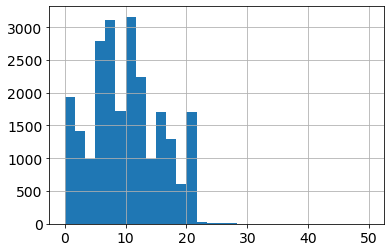

In [51]:
# поле total_images - выбросы вполне реалистичны
base_dataset['total_images'].hist(bins=30)
plt.show()

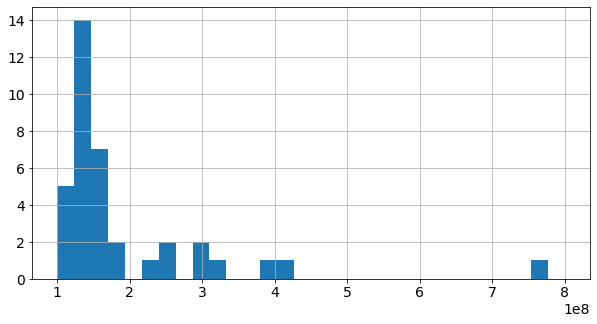

In [52]:
# выбросы по ценам также оставляем,  т.к. в Спб замки олигархов вполне могут быть
base_dataset['last_price'].hist(bins=30, range=(1*10**8, 8*10**8), figsize=(10,5))
plt.show()

In [53]:
#Но коробка с усами явно указывает нам на выбросы начиная со значений более 11,9 млн.
box = px.box(base_dataset,x=['last_price'],range_x=[0,20000000])
box.show()

Принято решение не удалять выбросы по цене более 12 млн. руб. т.к. подобные предложения могу не быть массовыми, но при этом вполне реальными

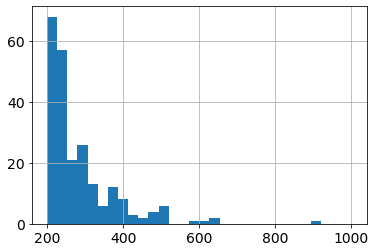

In [54]:
# площадь  более 400 м можно считать выбросами. Удалим данные с такими значениями
base_dataset['total_area'].hist(bins=30,  range=(200, 1000))
plt.show()

In [55]:
# посмотрим на рекомендации по выбросам по площади
box = px.box(base_dataset,x=['total_area'],range_x=[0,150])
box.show()

Удалим по рекомендации выбросы более 114 кв.м. Несмотря на то, что квартиры и дома свыше 200 и 300 м являются вполне реальными предложениями. Тем не менее подобные выброся могут оказать негативное влияние на рассчёт средних значений

In [56]:
# площадь  более 114 м можно считать выбросами. Удалим данные с такими значениями
base_dataset = base_dataset.loc[base_dataset['total_area'] <= 114]

In [57]:
# подготовим вспомогательный столбец для отслеживания выбросов дат
base_dataset['first_day_exposition_time'] = pd.to_datetime(base_dataset['first_day_exposition'], format='%Y-%m-%dT%H:%M:%S')

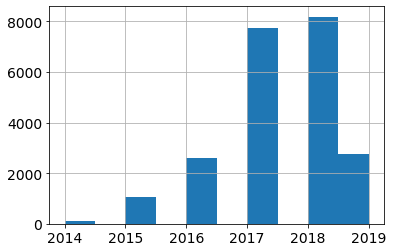

In [58]:
# выбросов по годам не обнаружено
base_dataset['first_day_exposition_time'].dt.year.hist()
plt.show()

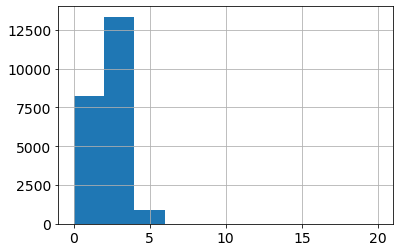

In [59]:
# По комнатам вполне может быть, оставляем как есть
base_dataset['rooms'].hist(range=(0,20))
plt.show()

In [60]:
base_dataset['rooms'].describe()

count    22446.000000
mean         1.947964
std          0.899375
min          0.000000
25%          1.000000
50%          2.000000
75%          3.000000
max          7.000000
Name: rooms, dtype: float64

In [61]:
# посмотрим на рекомендации по выбросам по комнатам
box = px.box(base_dataset,x=['rooms'])
#,range_x=[0,10]
box.show()

В данном случае выброс по комнатам не является критичным. Оставляем как есть

In [62]:
# Имеем 196 случаев с нулевым количеством комнат. 
print(base_dataset['rooms'][base_dataset['rooms']==0].count())

196


In [63]:
# Имеем 197 случаев с нулевым количеством комнат. Судя по общей и жилой площади это небольшие однокомнатные квартиры. 
# Поэтому исправим ошибку заполнения, пропишем количетво комнат 1.
base_dataset.loc[base_dataset['rooms']==0, 'rooms'] = 1

In [64]:
# смотрим уникальные значения высоты потолков и считаем их количество
round(base_dataset['ceiling_height'],0).value_counts()

3.0      17943
2.0       4209
4.0        254
27.0         9
25.0         7
8.0          4
14.0         4
5.0          4
1.0          2
32.0         2
28.0         1
100.0        1
6.0          1
24.0         1
26.0         1
10.0         1
23.0         1
20.0         1
Name: ceiling_height, dtype: int64

In [65]:
# явно высота потолков более 10 м это ошибка в заполнении данных. Поэтому все значения > 19м нужно поделить на 10
def ceiling_height_more_ten(row):
    if row['ceiling_height'] > 19:
        return row['ceiling_height'] * 0.1
    else:
        return row['ceiling_height']

In [66]:
# присваиваем новые значения
base_dataset['ceiling_height'] = base_dataset.apply(ceiling_height_more_ten, axis=1)

In [67]:
# вызывает подозрение только 2х комнатная квартира в Кронштадте по умеренной цене в 60ти этажном доме.
#  вероятно это всё-таки 6й этаж
base_dataset[base_dataset['floors_total']>50]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,locality_name_no_duplicates,first_day_exposition_time
2253,12,3800000,45.5,2018-06-28T00:00:00,2,2.88,60,27.4,4,False,False,False,7.4,0,Кронштадт,67763.0,49488.0,2,342.0,3,614.0,166.0,Кронштадт,2018-06-28
16731,9,3978000,40.0,2018-09-24T00:00:00,1,2.65,52,10.5,18,False,False,False,14.0,0,Санкт-Петербург,20728.0,12978.0,1,793.0,0,NaN,45.0,Санкт-Петербург,2018-09-24


In [68]:
# присваиваем этажу значение 6
base_dataset.loc[base_dataset['floors_total']==60, 'floors_total'] = 6

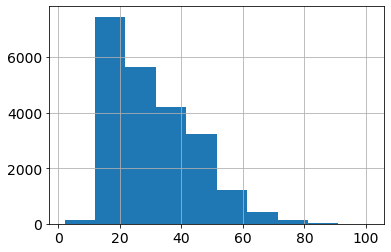

In [69]:
# такие выбросы возможны, с общей площадью данные коррелируют, оставляем как есть
base_dataset['living_area'].hist()
plt.show()

остальные поля с точки зрения выбросов не вызвали вопросов, данные вполне вероятны

проведем итоговую проверку на дубликаты

In [70]:
base_dataset.shape

(22446, 24)

In [71]:
print('Количество явных дубликатов', base_dataset.duplicated().sum())

Количество явных дубликатов 0


Проверка явных дубликатов не обнаружила

#### Выводы по разделу

Выполнена предобработка данных. Проведена оптимизация типов данных. Заполнены пропуски данных там, где это было уместно.

Пропуски высоты потолков и пропуски по высоте здания заменены на медианные значения по каждой локации

Проруски по жилой площади заполнены расчётным значением (произведение среднего % жилой площади на общую площадь квартиры)

Для заполнения пропусков площади кухни, подготовлена вспомогательная таблица со средней пропорцией площади кухни по каждой локации. При умножении на общёю площадь получены необходимые значения.

Пропущенные показатели по принадлежности к апартаментам, по количеству балконов, количество близлежащих парков и прудов, а также локации заполнены явно очевидными значениями False, 0, 0, 0 и unknown соответственно.

Пропускам в поле удаленности до аэропорта присвоены медианные значения для каждого населенного пункта (за исключением Санкт-Петербурга).

Пропуски расстояния до центра заполнены медианными значениями для каждой известной локации.

Осознанно не заполнялись пропуски по столбцам расстояния до парка и пруда, а также по дате размещения объявления.

Для перечня локаций проведен дополнительный анализ и устранены неявные дубликаты в данном поле таблицы. Проведена проверка на явные дубликаты.

Также, в рамках предобработки данных, также устранены некоторые редкие значения (выбросы).
Удалены выбросы более 114 кв.м. Несмотря на то, что квартиры и дома свыше 200 и 300 м являются вполне реальными предложениями. Тем не менее подобные выброся могут оказать негативное влияние на расчёт средних значений

### Посчитаем и добавим в таблицу новые столбцы

цена одного квадратного метра

In [72]:
base_dataset['price_of_square_meter'] = round(base_dataset['last_price']/base_dataset['total_area'], 1)

день недели публикации объявления (0 — понедельник, 1 — вторник и так далее)

In [73]:
base_dataset['day_of_the_week_exposition'] = base_dataset['first_day_exposition_time'].dt.dayofweek

месяц публикации объявления

In [74]:
base_dataset['month_exposition'] = base_dataset['first_day_exposition_time'].dt.month

год публикации объявления

In [75]:
base_dataset['year_exposition'] = base_dataset['first_day_exposition_time'].dt.year

In [ ]:
# Если года разные, то в новой колонке месяца отобразится первый день месяца ('2019-05-01')
# проработать на будущее
df['first_day_exposition'].dt.date #приводим к временному формату
df['first_day_exposition'].astype('datetime64[M]') 

In [76]:
def year_month(row):
    new_str = str(row['year_exposition']) + '_' + '%02d' %row['month_exposition']
#     new_str = 123
    return new_str

In [77]:
base_dataset['year_month_exposition'] = base_dataset.apply(year_month, axis=1)

In [78]:
# посмотрим что получилось 
base_dataset['year_month_exposition'].head()

0    2019_03
1    2018_12
2    2015_08
4    2018_06
5    2018_09
Name: year_month_exposition, dtype: object

тип этажа квартиры (значения — «‎первый», «последний», «другой»)

In [79]:
def type_of_floor(row):
    if row['floor'] == 1:
        return 'первый'
    elif row['floor'] == row['floors_total']:
        return 'последний'
    else:
        return 'другой'

In [80]:
base_dataset['type_of_floor'] = base_dataset.apply(type_of_floor, axis=1)

расстояние до центра города в километрах

In [81]:
base_dataset['cityCenters_nearest_km'] = round(base_dataset['cityCenters_nearest'] / 1000, 0)

### Исследовательский анализ данных

#### Построим ряд гистограмм для исследования наиболее значимых параметров:

    ○ общая площадь;

    ○ жилая площадь;

    ○ площадь кухни;

    ○ цена объекта;

    ○ количество комнат;

    ○ высота потолков;

    ○ этаж квартиры;

    ○ тип этажа квартиры («первый», «последний», «другой»);

    ○ общее количество этажей в доме;

    ○ расстояние до центра города в метрах;

    ○ расстояние до ближайшего аэропорта;

    ○ расстояние до ближайшего парка;

    ○ день и месяц публикации объявления

In [82]:
base_dataset['total_area'].describe()

count    22446.000000
mean        54.330174
std         19.337122
min         12.000000
25%         39.400000
50%         50.100000
75%         65.522500
max        114.000000
Name: total_area, dtype: float64

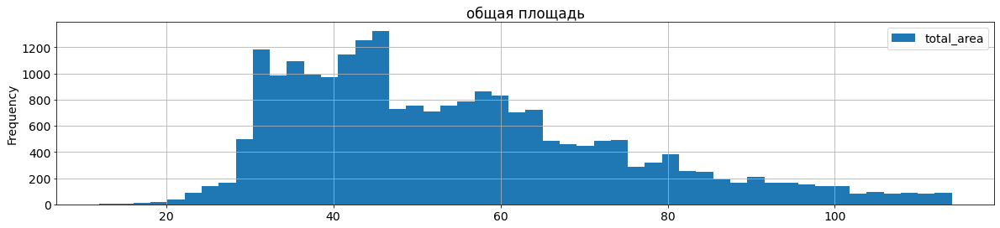

In [83]:
base_dataset.plot(kind='hist', title='общая площадь', y='total_area', bins=50, grid=True, figsize=(20,4))
plt.show()

Распределение по общей площади соответствует распределению Пуассона. Но, вместе с тем, при возрастании площади можно увидеть пиковые значения при 30, 46, 58, 64, 75 и 80 кв.м.

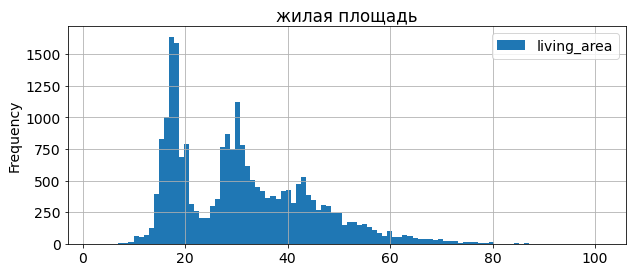

In [84]:
base_dataset.plot(kind='hist', title='жилая площадь', y='living_area', bins=100, grid=True, figsize=(10,4))
plt.show()

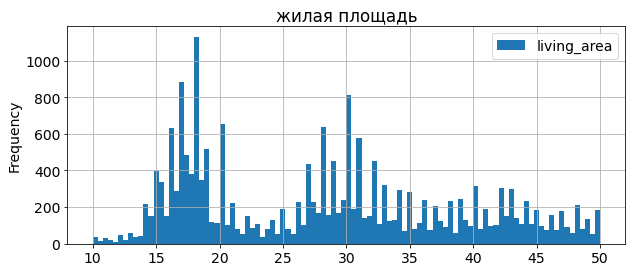

In [85]:
base_dataset.plot(kind='hist', title='жилая площадь', y='living_area', bins=100, grid=True, figsize=(10,4), range=(10,50))
plt.show()

Общий тренд по жилой площади похож на распределение Пуассона. Однако, в нем есть три пика на 18, 30 и 43 кв.м, которые каждый в отдельности представляют собой нормальное распределение Гаусса.

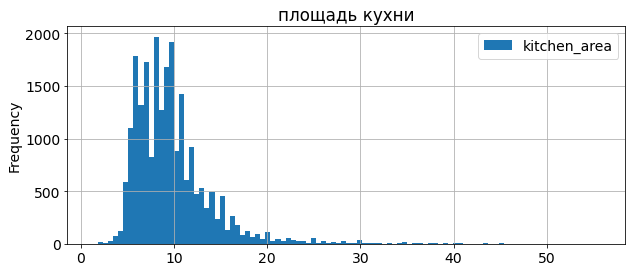

In [86]:
base_dataset.plot(kind='hist', title='площадь кухни', y='kitchen_area', bins=100, grid=True, figsize=(10,4))
plt.show()

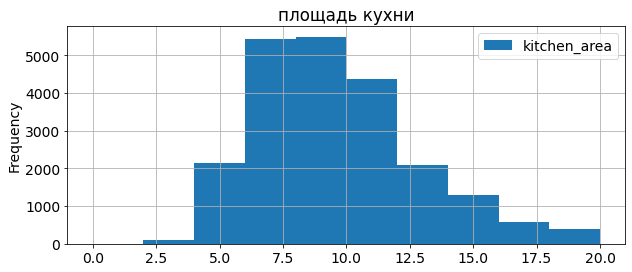

In [87]:
base_dataset.plot(kind='hist', title='площадь кухни', y='kitchen_area', bins=10, grid=True, figsize=(10,4), range=(0, 20))
plt.show()

Распределение площадей кухни близко к распределению Пуассона. Т.к. есть естественное ограничение минимального значения. Но вместе с тем ещё заментно значительное количество малых кухонь советской постройки

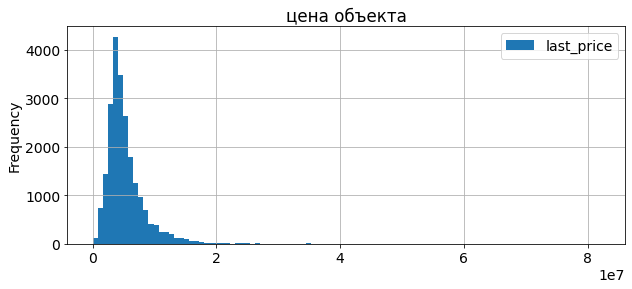

In [88]:
base_dataset.plot(kind='hist', title='цена объекта', y='last_price', bins=100, grid=True, figsize=(10,4))
plt.show()

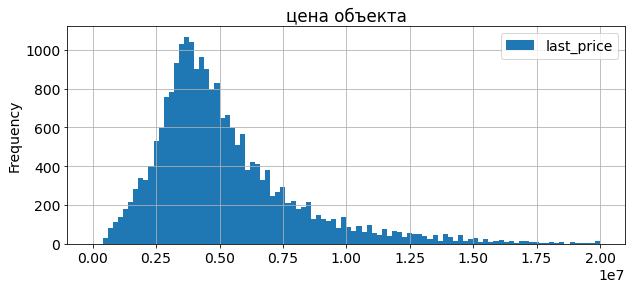

In [89]:
base_dataset.plot(kind='hist', title='цена объекта', y='last_price', bins=100, grid=True, figsize=(10,4), range=(0,20000000))
plt.show()

Распределение цены напоминает нормальное Гауссовское распределение с максимумом в районе 3х - 4х млн. рублей. Вместе с тем, более медленное снижение плотности распределения по сравнению с ростом говорит о большем количестве недвижмости премиум сегмента.

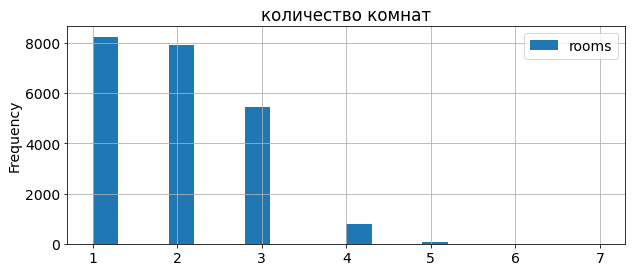

In [90]:
base_dataset.plot(kind='hist', title='количество комнат', y='rooms', bins=20, grid=True, figsize=(10,4))
plt.show()

По количеству комнат имеем классическое распределение Пуассона

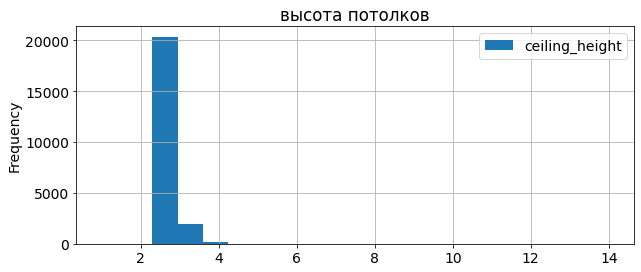

In [91]:
base_dataset.plot(kind='hist', title='высота потолков', y='ceiling_height', bins=20, grid=True, figsize=(10,4))
plt.show()

По высоте потолков имеем классическое распределение Пуассона

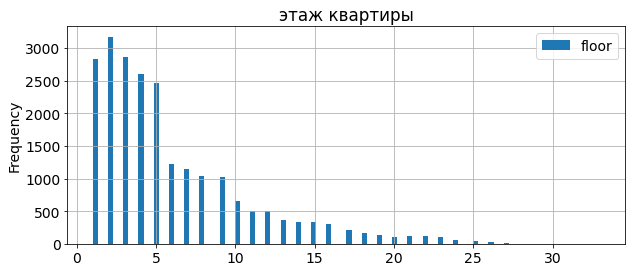

In [92]:
base_dataset.plot(kind='hist', title='этаж квартиры', y='floor', bins=100, grid=True, figsize=(10,4))
plt.show()

В распределении Пуассона по этажности бросается в глаза большое преимущество значений до 5-ти этажей включительно. Что говорит о целом ряде предложений из пятиэтажной застройки. Также прослеживается вторая "ступень значений" от 6 до 9 этажа. ПРеимущество предложений 5 и 9 этажек подтверждается на диаграмме ниже.

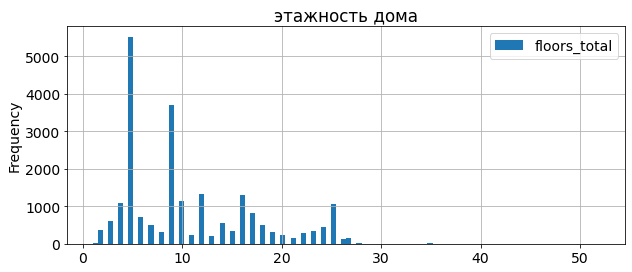

In [93]:
base_dataset.plot(kind='hist', title='этажность дома', y='floors_total', bins=100, grid=True, figsize=(10,4))
plt.show()

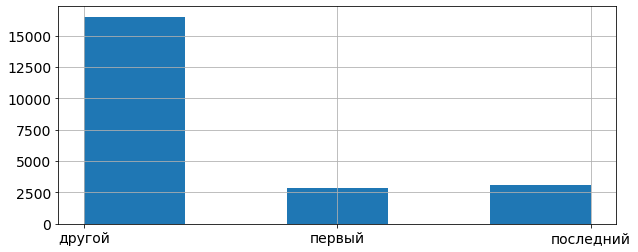

In [94]:
base_dataset['type_of_floor'].hist(bins=5, grid=True, figsize=(10,4))
plt.show()

In [95]:
base_dataset['type_of_floor'].value_counts()

другой       16512
последний     3104
первый        2830
Name: type_of_floor, dtype: int64

По типу этажа никакого вывода нет, кроме адекватности приведенной статистики. Полученные данные соответствуют реалиям

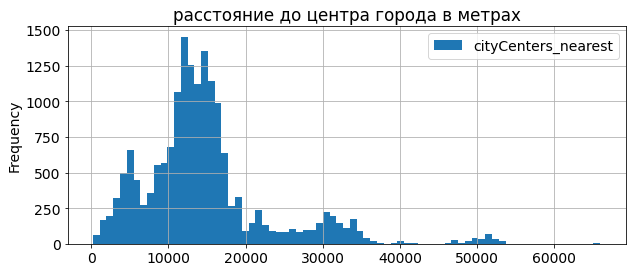

In [96]:
base_dataset.plot(kind='hist', title='расстояние до центра города в метрах', y='cityCenters_nearest', \
                  bins=75, grid=True, figsize=(10,4))
plt.show()

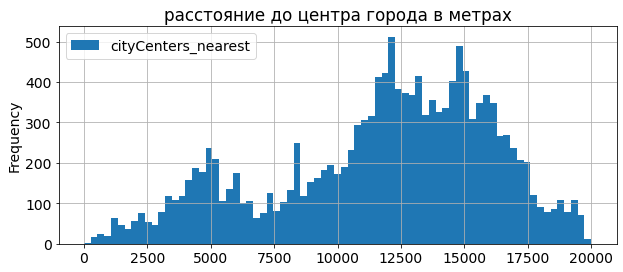

In [97]:
base_dataset.plot(kind='hist', title='расстояние до центра города в метрах', y='cityCenters_nearest', \
                  bins=75, grid=True, figsize=(10,4), range= (0,20000))
plt.show()

На диаграмме распределения расстояния до центра города мы видим несколько пиков. Вероятно, это указывает на неравномерность плотности жилой застройки

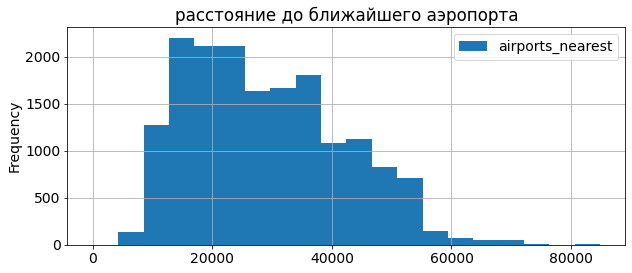

In [98]:
base_dataset.plot(kind='hist', title='расстояние до ближайшего аэропорта', y='airports_nearest', \
                  bins=20, grid=True, figsize=(10,4))
plt.show()

Распределение значений расстояний до аэропорта представляет что-то среднее между нормальным и распределением Пуассона

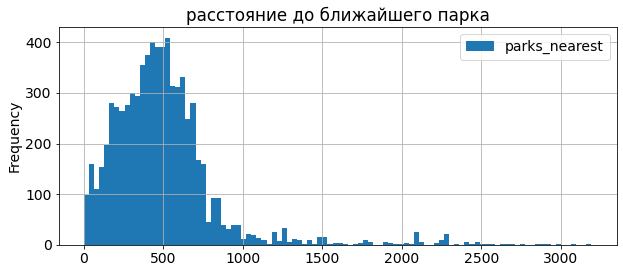

In [99]:
base_dataset.plot(kind='hist', title='расстояние до ближайшего парка', y='parks_nearest', \
                  bins=100, grid=True, figsize=(10,4) )
plt.show()

Значения расстояний до парка имеют нормальное распределение

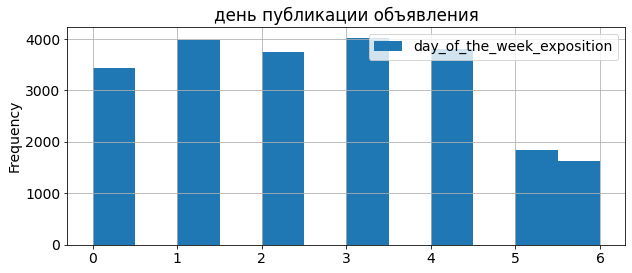

In [100]:
base_dataset.plot(kind='hist', title='день публикации объявления', y='day_of_the_week_exposition', \
                  bins=12, grid=True, figsize=(10,4) )
plt.show()

На лицо тенденция наибольшего количества публикаций в рабочие дни

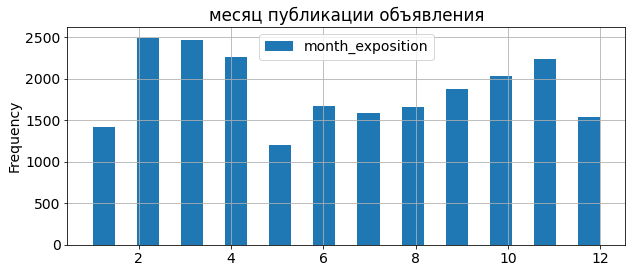

In [101]:
base_dataset.plot(kind='hist', title='месяц публикации объявления', y='month_exposition', \
                  bins=23, grid=True, figsize=(10,4) )
plt.show()

In [102]:
base_dataset.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,locality_name_no_duplicates,first_day_exposition_time,price_of_square_meter,day_of_the_week_exposition,month_exposition,year_exposition,year_month_exposition,type_of_floor,cityCenters_nearest_km
0,20,13000000,108.0,2019-03-07T00:00:00,3,2.70,16,51.0,8,False,False,False,25.0,0,Санкт-Петербург,18863.0,16028.0,1,482.0,2,755.0,NaN,Санкт-Петербург,2019-03-07,120370.4,3,3,2019,2019_03,другой,16.0
1,7,3350000,40.4,2018-12-04T00:00:00,1,2.63,11,18.6,1,False,False,False,11.0,2,посёлок Шушары,12817.0,18603.0,0,NaN,0,NaN,81.0,посёлок Шушары,2018-12-04,82920.8,1,12,2018,2018_12,первый,19.0
2,10,5196000,56.0,2015-08-20T00:00:00,2,2.70,5,34.3,4,False,False,False,8.3,0,Санкт-Петербург,21741.0,13933.0,1,90.0,2,574.0,558.0,Санкт-Петербург,2015-08-20,92785.7,3,8,2015,2015_08,другой,14.0
4,2,10000000,100.0,2018-06-19T00:00:00,2,3.03,14,32.0,13,False,False,False,41.0,0,Санкт-Петербург,31856.0,8098.0,2,112.0,1,48.0,121.0,Санкт-Петербург,2018-06-19,100000.0,1,6,2018,2018_06,другой,8.0
5,10,2890000,30.4,2018-09-10T00:00:00,1,2.60,12,14.4,5,False,False,False,9.1,0,городской посёлок Янино-1,NaN,NaN,0,NaN,0,NaN,55.0,городской посёлок Янино-1,2018-09-10,95065.8,0,9,2018,2018_09,другой,NaN


Бросаются в глаза пики сезонности подачи объявлений. Первый пик февраль-март, второй пик октябрь-ноябрь.

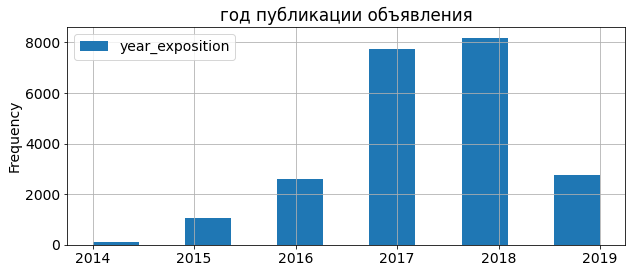

In [103]:
base_dataset.plot(kind='hist', title='год публикации объявления', y='year_exposition', \
                  bins=11, grid=True, figsize=(10,4) )
plt.show()

#### Изучим, как быстро продавались квартиры (столбец days_exposition)¶

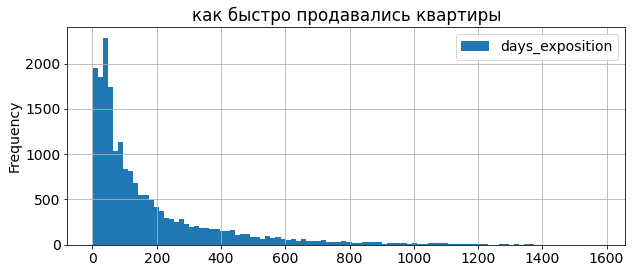

In [104]:
base_dataset.plot(kind='hist', title='как быстро продавались квартиры', y='days_exposition', \
                  bins=100, grid=True, figsize=(10,4) )
plt.show()

Видно ярко-выраженное распределение Пуассона

In [105]:
print('Среднее количество дней продажи', base_dataset['days_exposition'].mean())
print('Медиана по дням продажи', base_dataset['days_exposition'].median())

Среднее количество дней продажи 175.0533142682055
Медиана по дням продажи 92.0


Медиана по дням продажи почти в два раза ниже среднего значения. Очевидно влияние выбросов многолетних продаж элитной недвижимости на среднее значение.

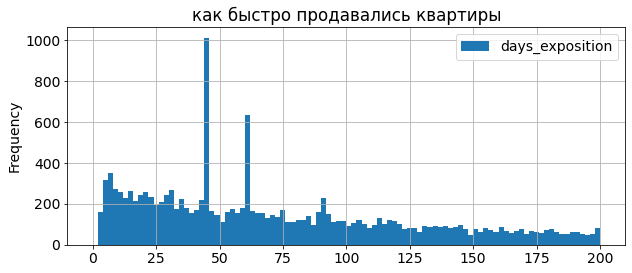

In [106]:
base_dataset.plot(kind='hist', title='как быстро продавались квартиры', y='days_exposition', \
                  bins=100, grid=True, figsize=(10,4), range=(0,200) )
plt.show()

In [107]:
base_dataset['days_exposition'].describe()

count    19582.000000
mean       175.053314
std        213.127955
min          1.000000
25%         44.000000
50%         92.000000
75%        222.000000
max       1580.000000
Name: days_exposition, dtype: float64

In [108]:
base_dataset['days_exposition'].describe()

count    19582.000000
mean       175.053314
std        213.127955
min          1.000000
25%         44.000000
50%         92.000000
75%        222.000000
max       1580.000000
Name: days_exposition, dtype: float64

Величина стандартного отклонения показывает большой разброс данных по дням продажи. По квартилям можно сделать вывод что относительно быстрой продажей можно считать период от 45 до 95 дней. Менее 45 дней - это очень быстро. Продажи более 230 дней можно считать необычно долгими. Продажи от 95 до 230 дней можно назвать относительно медленным периодом реализации.

Видны пики на значениях 45 и 60 дней. Вероятно это связано тем, что через 1.5 - 2 месяца безуспешных продаж продавец снижает цену и находит клиента

#### Проанализируем факторы влияющие на общую стоимость объекта.

Изучим зависимость цены от:

    ○ общей площади;

    ○ жилой площади;

    ○ площади кухни;

    ○ количества комнат;

    ○ этажа, на котором расположена квартира (первый, последний, другой);

    ○  даты размещения (день недели, месяц, год)

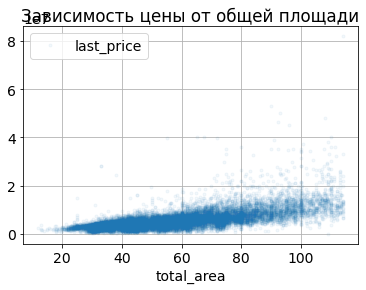

In [109]:
base_dataset.plot(x='total_area', y='last_price',\
                  style='.', title='Зависимость цены от общей площади',\
                  alpha=0.05, grid=True, sharex=False)
plt.show()

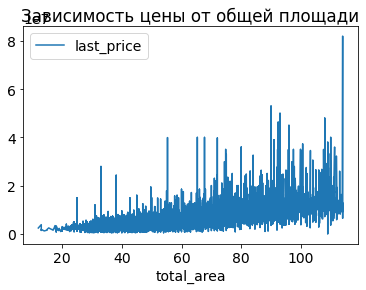

In [110]:
base_dataset.sort_values('total_area').plot(x='total_area', y='last_price',\
    style='-', title='Зависимость цены от общей площади')
plt.show()

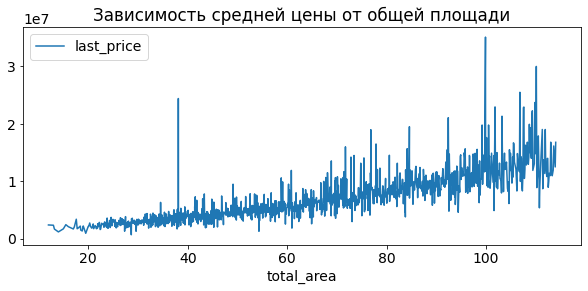

In [111]:
base_dataset.pivot_table(index='total_area', values='last_price')\
.plot(style='-',title='Зависимость средней цены от общей площади', figsize=(10,4))
plt.show()

In [112]:
print('Коэффициент корреляции цены от общей площади', round(base_dataset['total_area'].corr(base_dataset['last_price']), 2))

Коэффициент корреляции цены от общей площади 0.68


<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Верная интерпретация значений корреляции Пирсона. Ты молодец
</div>

На графике зависимости средней цены от общей площади виден минимальный разброс цен для площади до 120 кв.м, средний разброс цен от 120 до 180 кв.м, и максимальный разброс цен для площадей свыше 180 кв.м. Коэффициент корреляции = 0,69, что подтверждает наличие зависимости.

Коэффициент корреляции цены от жилой площади 0.55


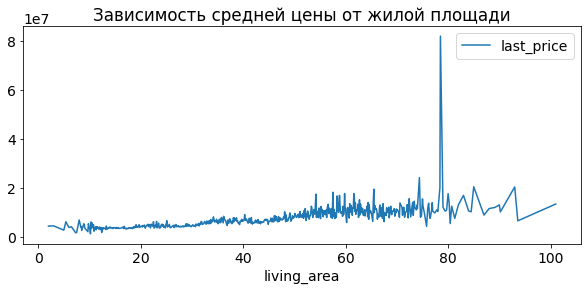

In [113]:
base_dataset.pivot_table(index='living_area', values='last_price')\
.plot(style='-',title='Зависимость средней цены от жилой площади', figsize=(10,4))
plt.show
print('Коэффициент корреляции цены от жилой площади', round(base_dataset['living_area'].corr(base_dataset['last_price']), 2))

Расчет корреляции показывает незначительную зависимость цены от жилой площади. На графике видна более четкая зависимость для площади от 10 до 70 кв.м. Остальные значения площади более подвержены разбросу по цене

Коэффициент корреляции цены от площади кухни 0.54


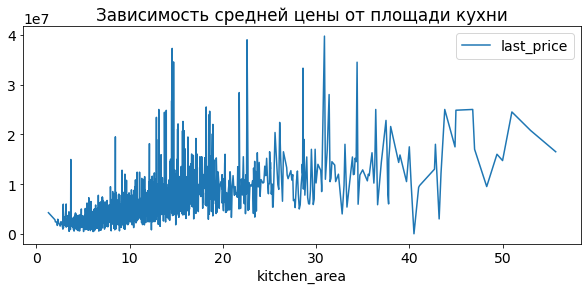

In [114]:
base_dataset.pivot_table(index='kitchen_area', values='last_price')\
.plot(style='-',title='Зависимость средней цены от площади кухни', figsize=(10,4))
plt.show
print('Коэффициент корреляции цены от площади кухни', round(base_dataset['kitchen_area'].corr(base_dataset['last_price']), 2))

График и расчёт коррекляции показывают слабую зависимость цены от площади кухни

Коэффициент корреляции цены от этажа 0.09


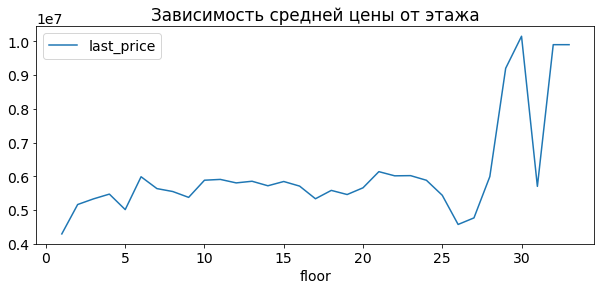

In [115]:
base_dataset.pivot_table(index='floor', values='last_price')\
.plot(style='-',title='Зависимость средней цены от этажа', figsize=(10,4))
plt.show
print('Коэффициент корреляции цены от этажа', round(base_dataset['floor'].corr(base_dataset['last_price']), 2))

Коэффициент корреляции цены от количества комнат 0.38


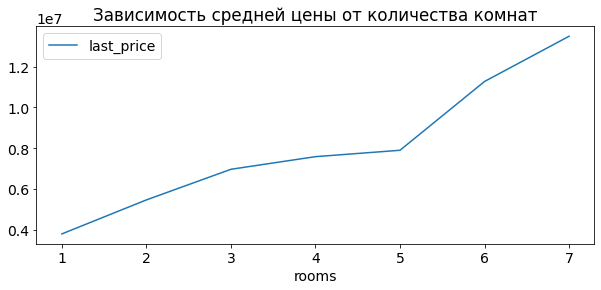

In [116]:
base_dataset.pivot_table(index='rooms', values='last_price')\
.plot(style='-',title='Зависимость средней цены от количества комнат', figsize=(10,4))
plt.show
print('Коэффициент корреляции цены от количества комнат', round(base_dataset['rooms'].corr(base_dataset['last_price']), 2))

Расчёт коэффициента коррекляции Пирсона показывает очень слабую зависимости цены от количества комнат. Хотя на графике ситуация выглядит по другому. Но мы принимает значения расчёта.

In [117]:
base_dataset.pivot_table(index='type_of_floor', values='last_price', aggfunc='median')

,last_price
type_of_floor,
другой,4700000
первый,3850000
последний,4150000


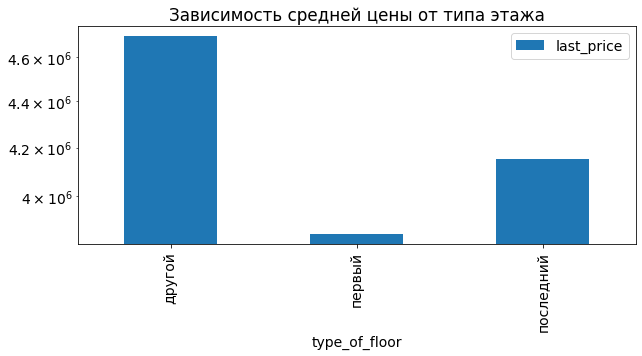

In [118]:
# для наглядности используем логарифмическую шкалу
base_dataset.pivot_table(index='type_of_floor', values='last_price', aggfunc=('median'))\
.plot(style='-',title='Зависимость средней цены от типа этажа', figsize=(10,4), kind='bar', logy=True)
plt.show()

Анализ медианных значений показвает наиболее низкую стоимость первых этажей, а также снижение стоимости последних этажей по сравнению с остальными

Коэффициент корреляции цены от дня недели размещения объявления -0.02


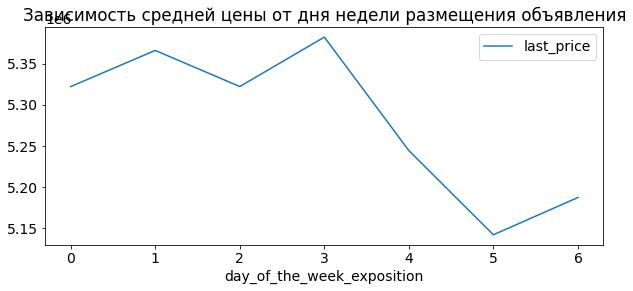

In [119]:
base_dataset.pivot_table(index='day_of_the_week_exposition', values='last_price')\
.plot(style='-',title='Зависимость средней цены от дня недели размещения объявления', figsize=(10,4))
plt.show
print('Коэффициент корреляции цены от дня недели размещения объявления', round(base_dataset['day_of_the_week_exposition'].corr(base_dataset['last_price']), 2))

Очевидно, что анализ показал полное отсутствие зависимости цены от дня недели

Коэффициент корреляции цены от месяца размещения объявления 0.0


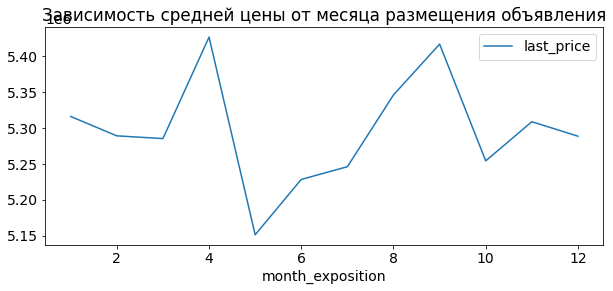

In [120]:
base_dataset.pivot_table(index='month_exposition', values='last_price')\
.plot(style='-',title='Зависимость средней цены от месяца размещения объявления', figsize=(10,4))
plt.show
print('Коэффициент корреляции цены от месяца размещения объявления', round(base_dataset['month_exposition'].corr(base_dataset['last_price']), 2))

Коэффициент корреляции показывает отсутствие зависимости цены от месяца подачи объявления. Вместе с тем на графике зависимости прослеживается сезонность. Видны пики повышения стоимости в апреле, сентябре. В мае и октябре заметен спад цен.

Коэффициент корреляции цены от года размещения объявления -0.01


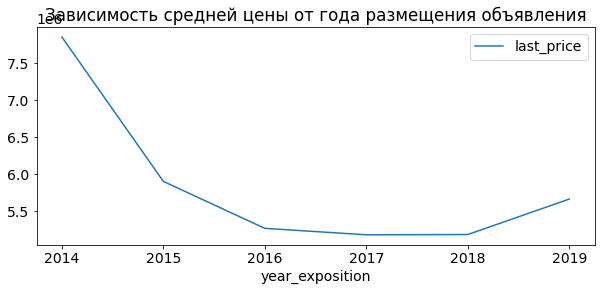

In [121]:
base_dataset.pivot_table(index='year_exposition', values='last_price')\
.plot(style='-',title='Зависимость средней цены от года размещения объявления', figsize=(10,4))
plt.show
print('Коэффициент корреляции цены от года размещения объявления', round(base_dataset['year_exposition'].corr(base_dataset['last_price']), 2))

Коэффициент корреляции цены  кв.м от года размещения объявления 0.05


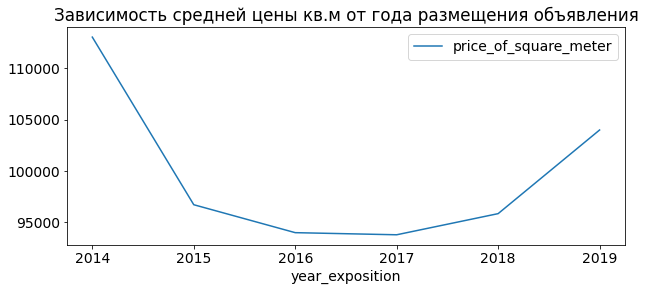

In [122]:
base_dataset.pivot_table(index='year_exposition', values='price_of_square_meter')\
.plot(style='-',title='Зависимость средней цены кв.м от года размещения объявления', figsize=(10,4))
plt.show
print('Коэффициент корреляции цены  кв.м от года размещения объявления', round(base_dataset['year_exposition'].corr(base_dataset['price_of_square_meter']), 2))

Коэффициент корреляции площади от года размещения объявления -0.06


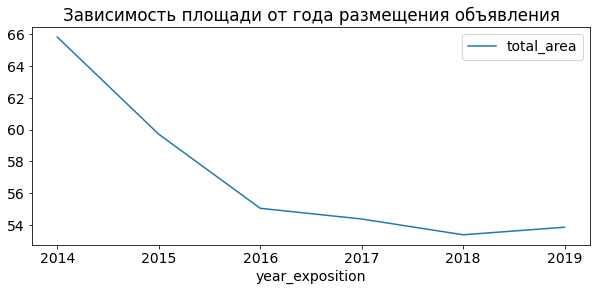

In [123]:
base_dataset.pivot_table(index='year_exposition', values='total_area')\
.plot(style='-',title='Зависимость площади от года размещения объявления', figsize=(10,4))
plt.show
print('Коэффициент корреляции площади от года размещения объявления', round(base_dataset['year_exposition'].corr(base_dataset['total_area']), 2))

Коэффициент корреляции показывает отсутствие зависимости цены от года подачи объявления. Отрицатеьлная динамика цен по годам скорее говорит о постепенной популяризации сервиса в сегменте низкой ценовой категории и в более мелких поселениях до 2017 года. После чего на графике отражается естественный рост цен.

#### Посчитаем среднюю цену одного квадратного метра

Посчитаем среднюю цену одного квадратного метра в 10 населённых пунктах с наибольшим числом объявлений

In [124]:
base_dataset.pivot_table(index='locality_name', values='last_price', aggfunc=['count', 'mean', 'median'])\
.sort_values(('count', 'last_price'), ascending=False)\
.head(10)\
.sort_values(('mean', 'last_price'), ascending=False)

,count,mean,median
,last_price,last_price,last_price
locality_name,,,
Санкт-Петербург,14568,6.319382e+06,5300000.0
Пушкин,347,5.600245e+06,5000000.0
посёлок Парголово,326,4.477609e+06,4100000.0
деревня Кудрово,298,4.204742e+06,3785000.0
посёлок Шушары,437,4.073812e+06,3950000.0
Колпино,336,3.853986e+06,3600000.0
Всеволожск,395,3.751263e+06,3450000.0
посёлок Мурино,522,3.672049e+06,3400000.0


Из представленных 10 локаций с наибольшим количеством объявлений, макимальная средняя стоимость в Санкт-Петербурге, минимальная средняя стоимость в Выборге.

#### Как стоимость объектов зависит от расстояния до центра города

Ранее мы посчитали расстояние до центра в километрах. Теперь выделим квартиры в Санкт-Петербурге с помощью столбца locality_name и вычислим среднюю цену каждого километра

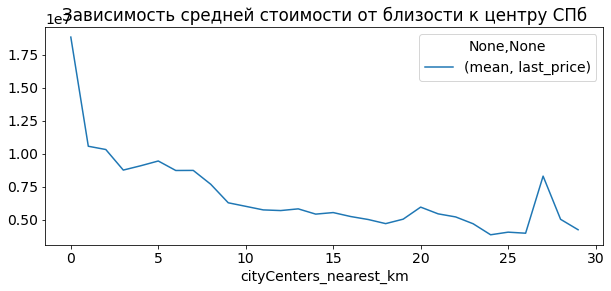

In [125]:
base_dataset[base_dataset['locality_name']=='Санкт-Петербург']\
.pivot_table(index='cityCenters_nearest_km', values=['last_price'], aggfunc=['mean'])\
.plot(style='-',title='Зависимость средней стоимости от близости к центру СПб', figsize=(10,4))
plt.show()

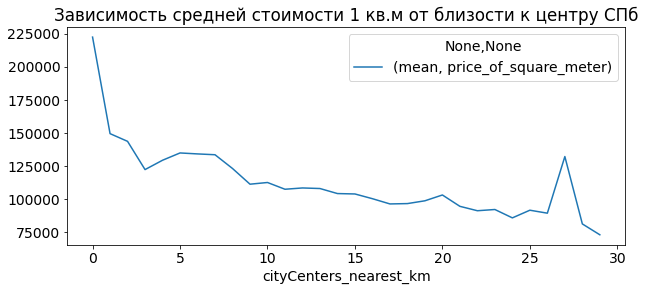

In [126]:
base_dataset[base_dataset['locality_name']=='Санкт-Петербург']\
.pivot_table(index='cityCenters_nearest_km', values=['price_of_square_meter'], aggfunc=['mean'])\
.plot(style='-',title='Зависимость средней стоимости 1 кв.м от близости к центру СПб', figsize=(10,4))
plt.show()

При анализе получена очевидная картина снижения средней стоимости недвижимости при удаления от центра. Ярко выражен резкий рост стоимости в самом центре от 2х до 0 км. Вместе с тем, можно отметить снижение стоимости на расстоянии 3х км, и один из пиков стоимости для 6-ти, 7-ми км от центра. Также виден пик роста цен для расстояния 27 км.

In [127]:
base_dataset.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,locality_name_no_duplicates,first_day_exposition_time,price_of_square_meter,day_of_the_week_exposition,month_exposition,year_exposition,year_month_exposition,type_of_floor,cityCenters_nearest_km
0,20,13000000,108.0,2019-03-07T00:00:00,3,2.70,16,51.0,8,False,False,False,25.0,0,Санкт-Петербург,18863.0,16028.0,1,482.0,2,755.0,NaN,Санкт-Петербург,2019-03-07,120370.4,3,3,2019,2019_03,другой,16.0
1,7,3350000,40.4,2018-12-04T00:00:00,1,2.63,11,18.6,1,False,False,False,11.0,2,посёлок Шушары,12817.0,18603.0,0,NaN,0,NaN,81.0,посёлок Шушары,2018-12-04,82920.8,1,12,2018,2018_12,первый,19.0
2,10,5196000,56.0,2015-08-20T00:00:00,2,2.70,5,34.3,4,False,False,False,8.3,0,Санкт-Петербург,21741.0,13933.0,1,90.0,2,574.0,558.0,Санкт-Петербург,2015-08-20,92785.7,3,8,2015,2015_08,другой,14.0
4,2,10000000,100.0,2018-06-19T00:00:00,2,3.03,14,32.0,13,False,False,False,41.0,0,Санкт-Петербург,31856.0,8098.0,2,112.0,1,48.0,121.0,Санкт-Петербург,2018-06-19,100000.0,1,6,2018,2018_06,другой,8.0
5,10,2890000,30.4,2018-09-10T00:00:00,1,2.60,12,14.4,5,False,False,False,9.1,0,городской посёлок Янино-1,NaN,NaN,0,NaN,0,NaN,55.0,городской посёлок Янино-1,2018-09-10,95065.8,0,9,2018,2018_09,другой,NaN


<div class="alert alert-info"> <b>Комментарии студента:</b> Если считать самый центр, то от края до края 6-7 км. Но мнения о центре расходятся) Взял за основу одно из них
</div>

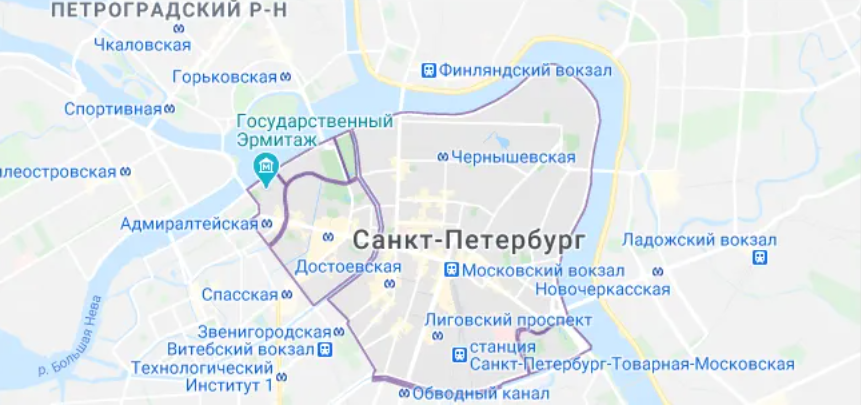

### Общий вывод

В проекте исследованы данные сервиса Яндекс Недвижимость — архив объявлений за несколько лет о продаже квартир в Санкт-Петербурге и соседних населённых пунктах.

Выполнена предобработка данных. Проведена оптимизация типов данных. Заполнены пропуски данных там, где это было уместно.

Пропуски высоты потолков и пропуски по высоте здания заменены на медианные значения по каждой локации

Проруски по жилой площади заполнены расчётным значением (произведение среднего % жилой площади на общую площадь квартиры)

Для заполнения пропусков площади кухни, подготовлена вспомогательная таблица со средней пропорцией площади кухни по каждой локации. При умножении на общёю площадь получены необходимые значения.

Пропущенные показатели по принадлежности к апартаментам, по количеству балконов, количество близлежащих парков и прудов, а также локации заполнены явно очевидными значениями False, 0, 0, 0 и unknown соответственно.

Пропускам в поле удаленности до аэропорта присвоены медианные значения для каждого населенного пункта (за исключением Санкт-Петербурга).

Пропуски расстояния до центра заполнены медианными значениями для каждой известной локации.

Осознанно не заполнялись пропуски по столбцам расстояния до парка и пруда, а также по дате размещения объявления.

Для перечня локаций проведен дополнительный анализ и устранены неявные дубликаты в данном поле таблицы. Проведена проверка на явные дубликаты.

Также, в рамках предобработки данных, также устранены некоторые редкие значения (выбросы).
Удалены выбросы более 114 кв.м. Несмотря на то, что квартиры и дома свыше 200 и 300 м являются вполне реальными предложениями. Тем не менее подобные выброся могут оказать негативное влияние на расчёт средних значений

В рамках проведенного исследования найдены определенные особенности и зависимости, существующие на рынке недвижимости региона.

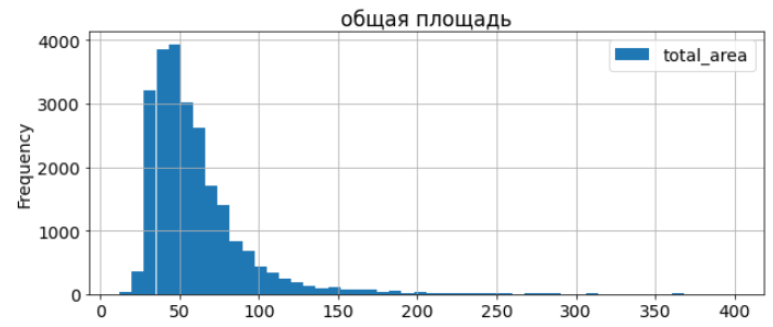

Большинство предложений по квартирам общей площадью от 40 до 69 кв.м. Значительное стандартное отклонение 32 кв.м говорит о большом разбросе данных. В целом, распределение по общей площади соответствует классическому распределению Пуассона.

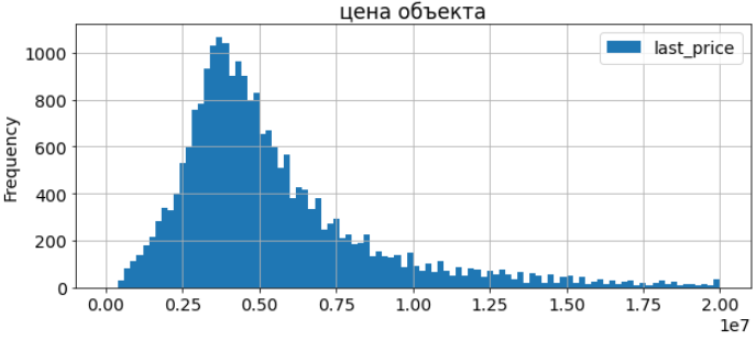

Распределение цены напоминает нормальное Гауссовское распределение с максимумом в районе 3х - 4х млн. рублей. Вместе с тем, более медленное снижение плотности распределения по сравнению с ростом говорит о большем количестве недвижмости премиум сегмента.

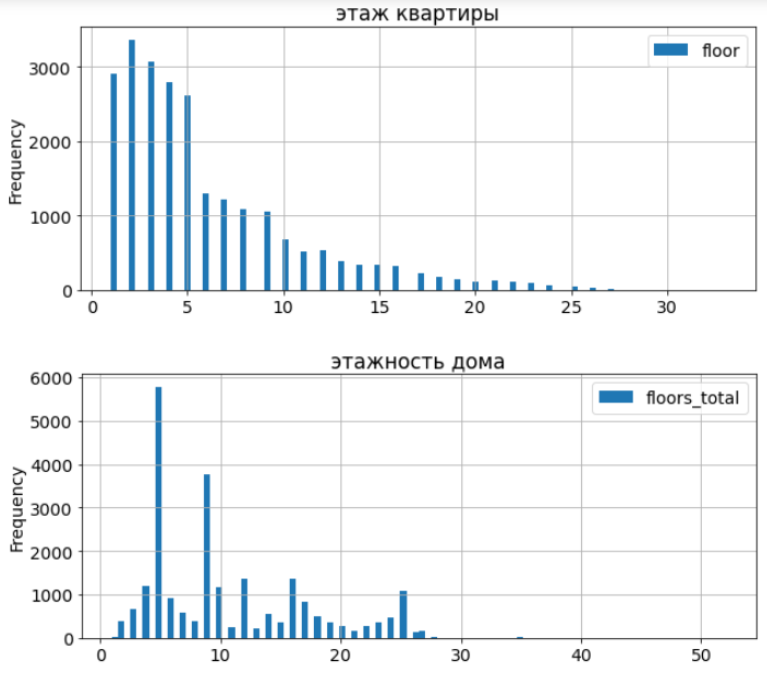

В распределении Пуассона по этажности бросается в глаза большое преимущество значений до 5-ти этажей включительно. Что говорит о целом ряде предложений из пятиэтажной застройки. Также прослеживается вторая "ступень значений" от 6 до 9 этажа. Преимущество предложений 5 и 9 этажек подтверждается на диаграмме этажности дома.

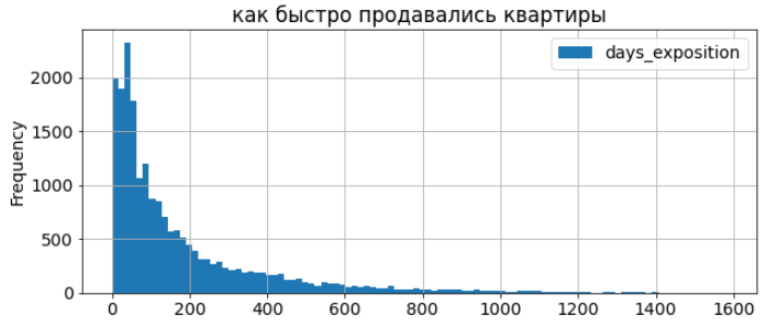

Величина стандартного отклонения показывает большой разброс данных по дням продажи. По квартилям можно сделать вывод что относительно быстрой продажей можно считать период от 45 до 95 дней. Менее 45 дней - это очень быстро. Продажи более 230 дней можно считать необычно долгими. Продажи от 95 до 230 дней можно назвать относительно медленным периодом реализации.

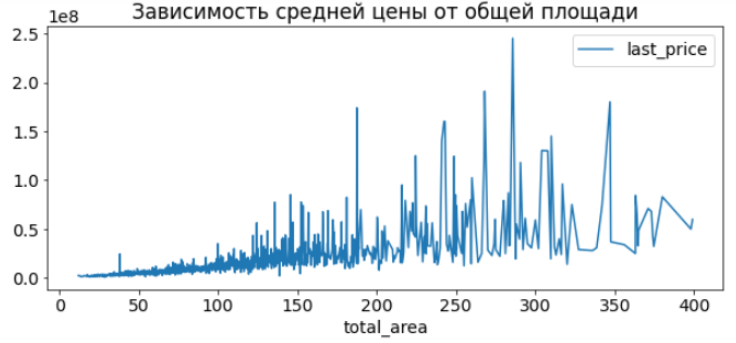

На графике зависимости средней цены от общей площади виден минимальный разброс цен для площади до 120 кв.м, средний разброс цен от 120 до 180 кв.м, и максимальный разброс цен для площадей свыше 180 кв.м. Коэффициент корреляции = 0,69, что подтверждает наличие зависимости.

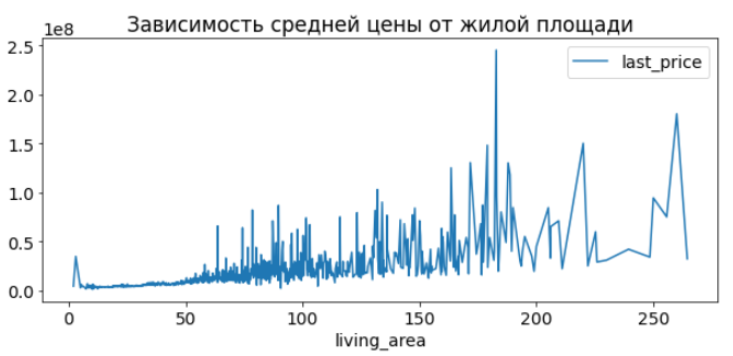

Расчет корреляции показывает незначительную зависимость цены от жилой площади. На графике видна более четкая зависимость для площади от 10 до 60 кв.м. Остальные значения площади более подвержены разбросу по цене

Расчёт коррекляции показывает слабую зависимость цены от площади кухни и полное отсуствие зависимости цены от количества комнат.

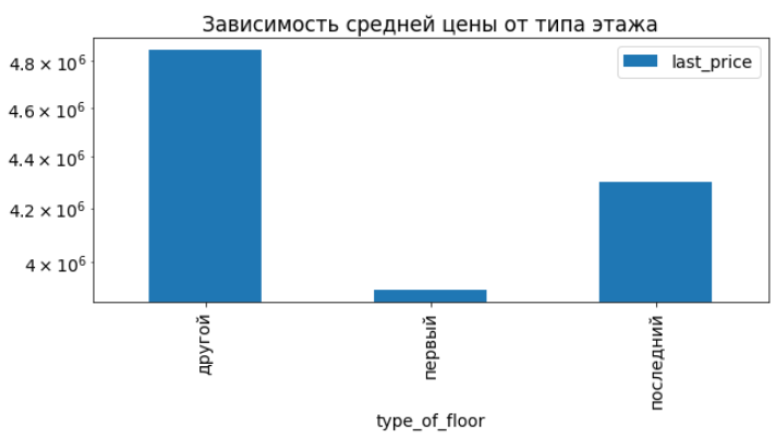

Анализ медианных значений показвает наиболее низкую стоимость первых этажей, а также снижение стоимости последних этажей по сравнению с остальными

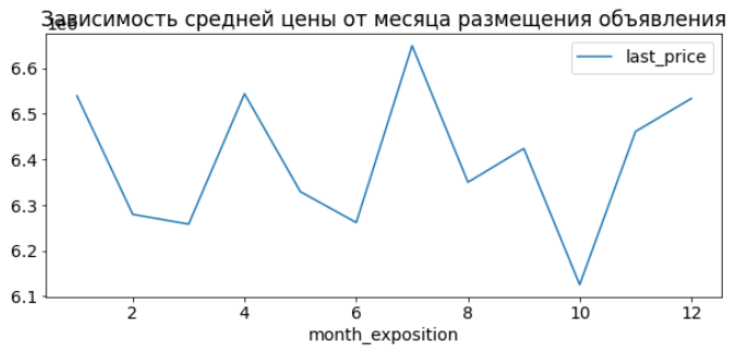

Коэффициент корреляции показывает отсутствие зависимости цены от месяца подачи объявления. Вместе с тем на графике зависимости прослеживается сезонность. Видны пики повышения стоимости в новогодний период, в апреле, июле. В октябре заметен спад цен.

В рамках исследования рассчитана средняя цена одного квадратного метра в 10 населённых пунктах с наибольшим числом объявлений. Из представленных локаций макимальная средняя стоимость в Санкт-Петербурге, минимальная средняя стоимость в Выборге.

Отдельно для Санкт-Петербурга рассчитана зависимость средней цены от близости к центру города.

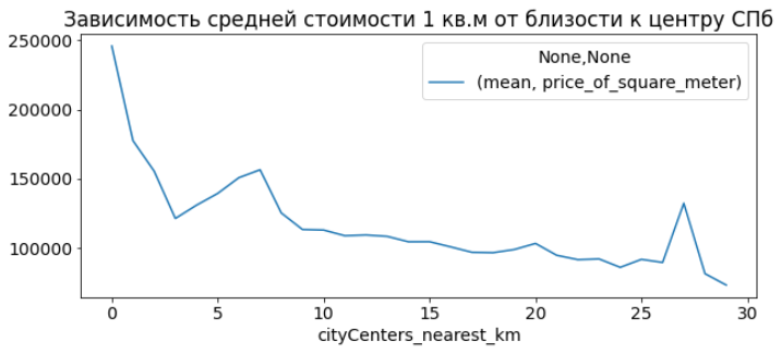

При анализе получена очевидная картина снижения средней стоимости недвижимости при удаления от центра. Ярко выражен резкий рост стоимости в самом центре от 2х до 0 км. Вместе с тем, можно отметить снижение стоимости на расстоянии 3х км, и один из пиков стоимости для 6-ти, 7-ми км от центра. Также виден пик роста цен для расстояния 27 км.